# Ranking Ventral Activity of Odorant CSVs

A notebook for ranking the ventral activity of odorant stimuli given by data in CSV files.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

%matplotlib inline

A list of available CSV image files is loaded.

In [2]:
p = Path('.')
all_csvs = list(p.glob('csvs/*.csv'))

The average activity value across all image files is calculated.

In [3]:
data = []

for file in all_csvs:
    df = pd.read_csv(file, index_col=None, header=0)
    file_avg = df.mean(axis='columns').mean(axis='index')
    data.append(file_avg)

avg = np.mean(data)
print(avg)

-0.02022643180380698


For each CSV image file, the average activity value of each row is calculated and the difference between these values and the previously calculated average across all images is stored. For all values in the middle of the image (index range 20:60), the sum is multiplied by a value of -10. For all values in the top and bottom of the image (index ranges 0:20 and 60:79), the sum is multiplied by a value of +10. These values together determine the overall activity value.

In [4]:
activity_data = []

for file in all_csvs:
    df = pd.read_csv(file, index_col=None, header=0)
    
    mid_avg = df[20:60].mean(axis='columns').mean(axis='index')
    top_avgs = df[0:20]
    bttm_avgs = df[60:79]
    outer_avg = pd.concat([top_avgs, bttm_avgs]).mean(axis='columns').mean(axis='index')
    
    mid_val = (mid_avg - avg) * -10
    outer_val = (outer_avg - avg) * 10
    activity_val = mid_val + outer_val
    activity_data.append({'file': file, 'activity': activity_val})

A DataFrame is created from the previously constructed list and sort by lowest activity level to highest.

In [5]:
rankings = pd.DataFrame(activity_data, columns=['file', 'activity'])
ranked_df = rankings.sort_values(by='activity')
print(ranked_df)

                                    file   activity
398  csvs/methyl trans-2-octenoate_0.csv  -8.343475
65                    csvs/nonanal_0.csv  -8.220548
86           csvs/methyl octanoate_0.csv  -8.042794
48                 csvs/2-decanone_2.csv  -6.954552
5                     csvs/decanal_2.csv  -6.931615
..                                   ...        ...
94                 csvs/eucalyptol_1.csv   9.998838
105         csvs/methyl salicylate_7.csv  10.090431
151      csvs/4-tert-butylpyridine_0.csv  10.215395
238      csvs/2,3-dimethylpyrazine_0.csv  10.221003
261                csvs/eucalyptol_2.csv  11.964446

[432 rows x 2 columns]


The DataFrame is then split into multiple lists for easier plotting and visualization

In [6]:
ranked_csvs = ranked_df['file']
ranked_split = [ranked_csvs[x:x+54] for x in range(0, len(ranked_csvs), 54)]

The list is then iterated through and plotted below

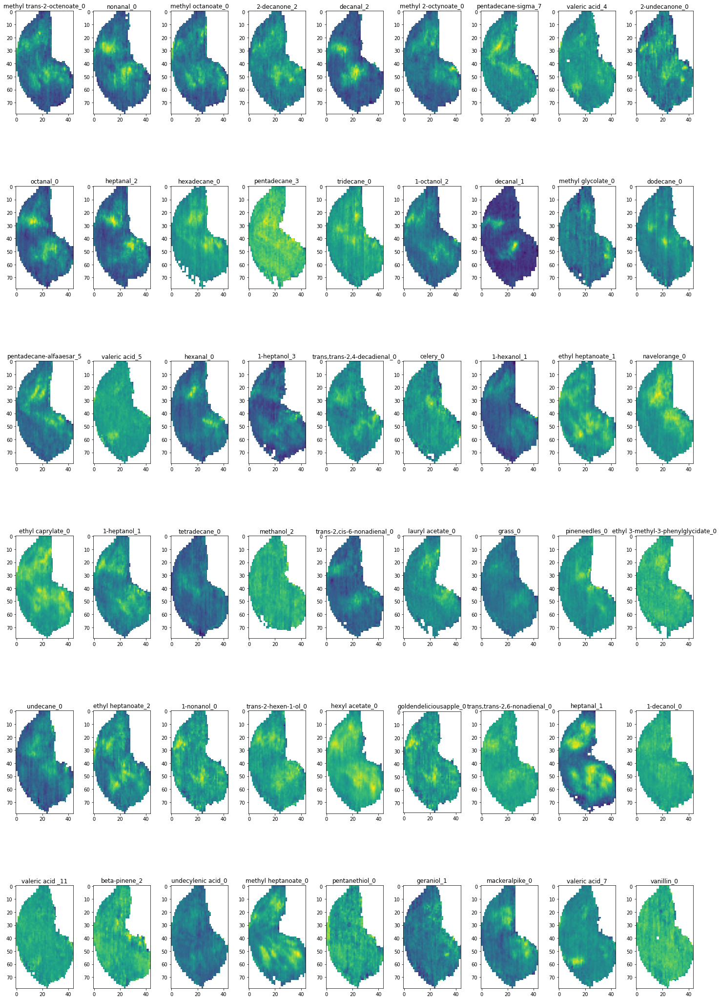

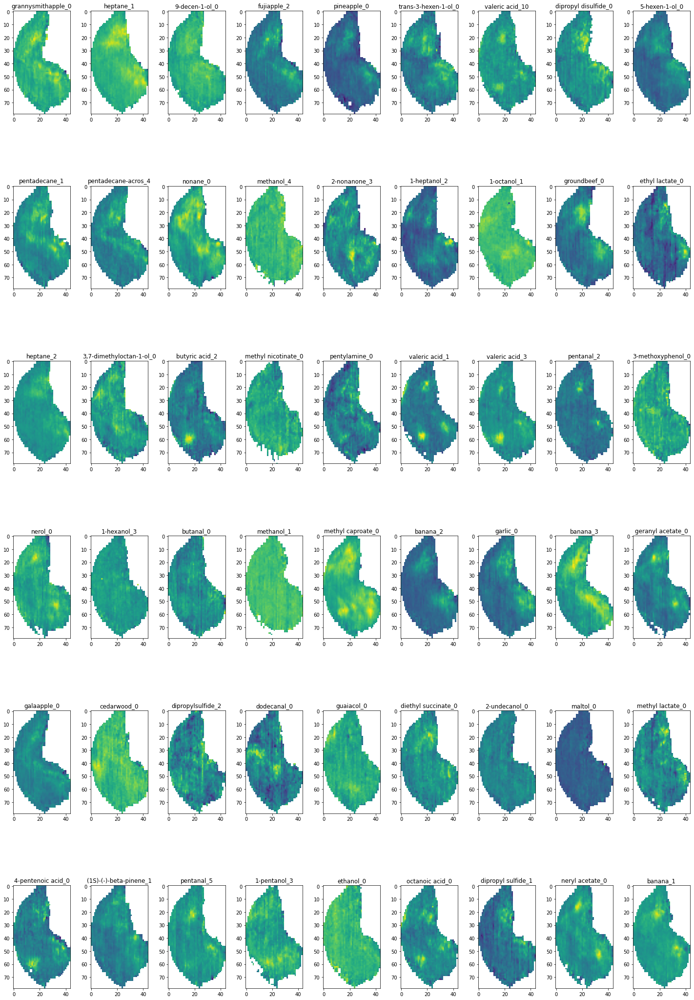

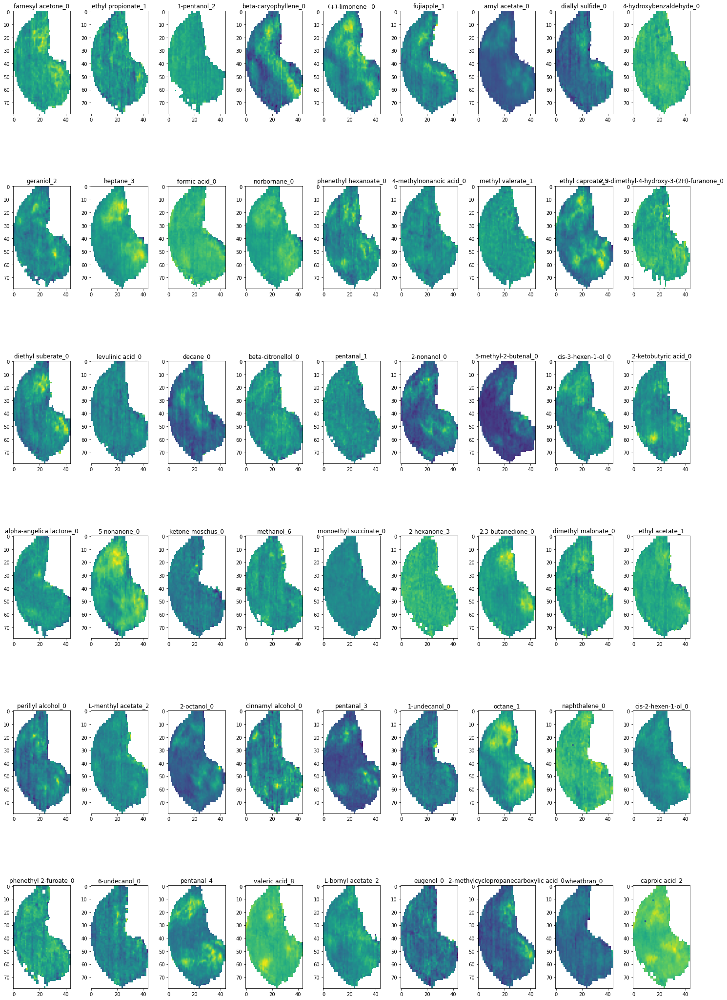

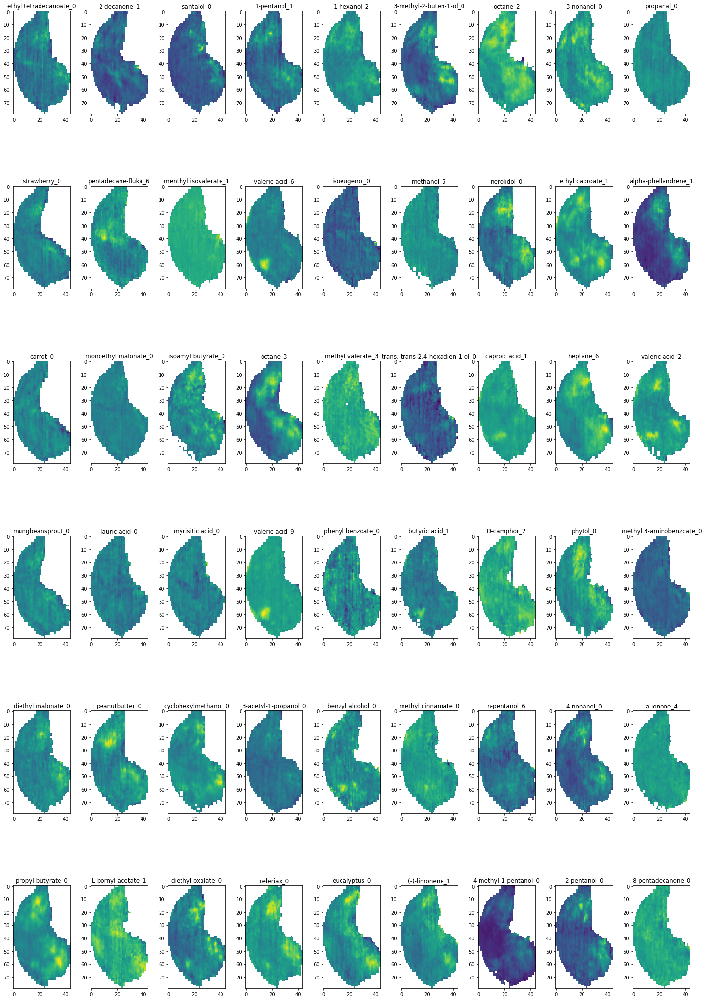

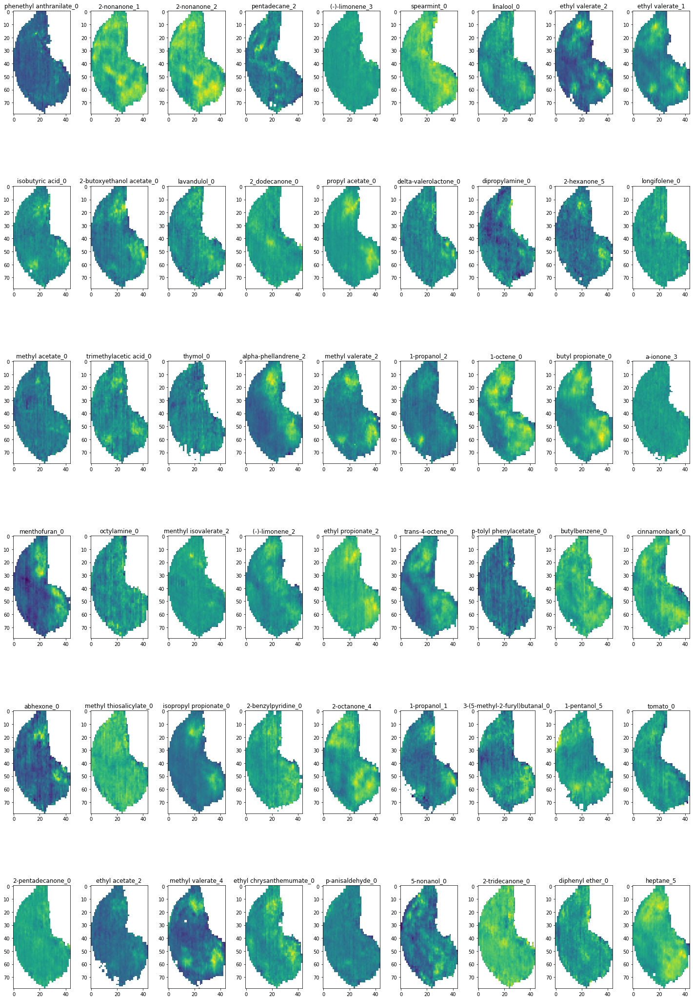

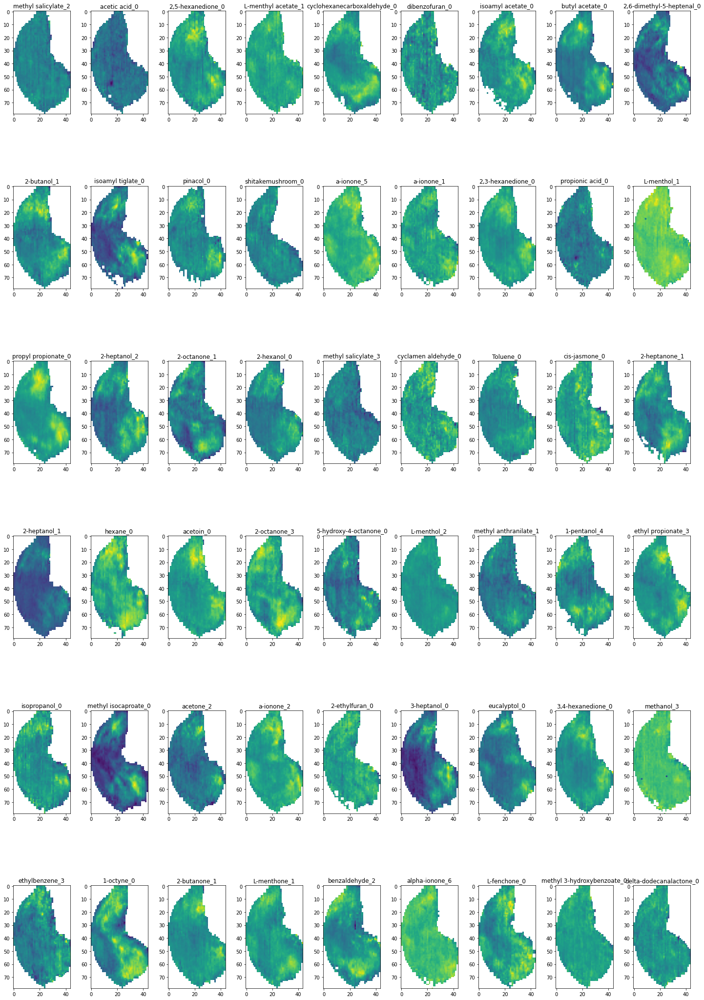

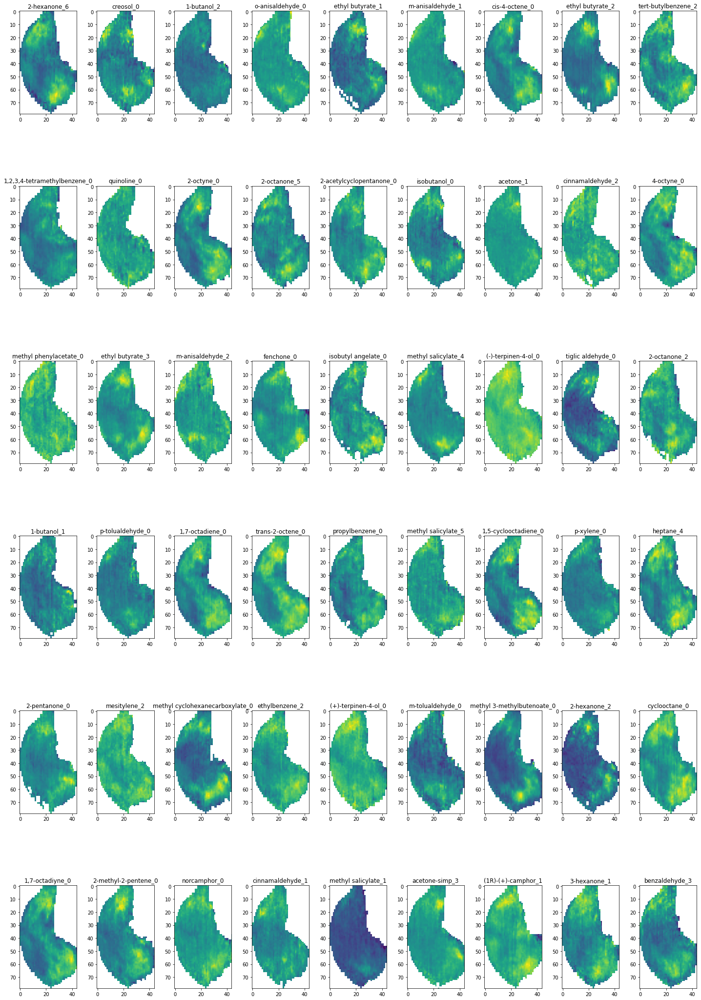

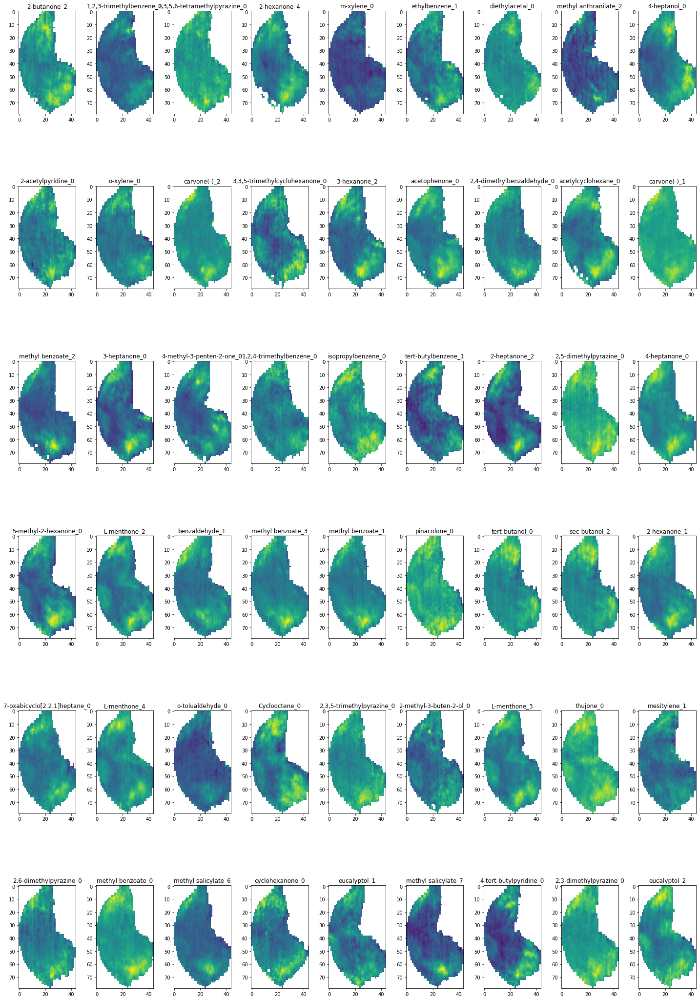

In [7]:
for csvs in ranked_split:
    fig, ax = plt.subplots(6, 9, figsize=(20,30))
    fig.tight_layout()
    ax = ax.ravel()
    
    for ax_id, file in enumerate(csvs):
        df = pd.read_csv(file, index_col=None, header=0)
        ax[ax_id].set_title(Path(file).stem)
        ax[ax_id].imshow(df)